# Adult Data Analysis

## Data Description
This particular dataset comes from the UCI repository of machine learning databases. The task is to predict if an individual's annual income exceeds $50,000 based on the census data. There exist 6 continuous and 8 nominal attributes in the dataset.  
An individual's annual income results from various factors. Intuitively, it is influenced by the individual's education level, age, gender, occupation etc.  

Importing the necesssary libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn import svm, metrics
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
import warnings
warnings.filterwarnings("ignore")

## Loading the Data

In [2]:
data = pd.read_csv("adult.csv")

In [3]:
data.head()

,age,workclass,fnlwgt,education,educational-num,marital-status,occupation,relationship,race,gender,capital-gain,capital-loss,hours-per-week,native-country,income
0,25,Private,226802,11th,7,Never-married,Machine-op-inspct,Own-child,Black,Male,0,0,40,United-States,<=50K
1,38,Private,89814,HS-grad,9,Married-civ-spouse,Farming-fishing,Husband,White,Male,0,0,50,United-States,<=50K
2,28,Local-gov,336951,Assoc-acdm,12,Married-civ-spouse,Protective-serv,Husband,White,Male,0,0,40,United-States,>50K
3,44,Private,160323,Some-college,10,Married-civ-spouse,Machine-op-inspct,Husband,Black,Male,7688,0,40,United-States,>50K
4,18,?,103497,Some-college,10,Never-married,?,Own-child,White,Female,0,0,30,United-States,<=50K


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48842 entries, 0 to 48841
Data columns (total 15 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   age              48842 non-null  int64 
 1   workclass        48842 non-null  object
 2   fnlwgt           48842 non-null  int64 
 3   education        48842 non-null  object
 4   educational-num  48842 non-null  int64 
 5   marital-status   48842 non-null  object
 6   occupation       48842 non-null  object
 7   relationship     48842 non-null  object
 8   race             48842 non-null  object
 9   gender           48842 non-null  object
 10  capital-gain     48842 non-null  int64 
 11  capital-loss     48842 non-null  int64 
 12  hours-per-week   48842 non-null  int64 
 13  native-country   48842 non-null  object
 14  income           48842 non-null  object
dtypes: int64(6), object(9)
memory usage: 5.6+ MB


In [5]:
data.shape

(48842, 15)

In [6]:
data.describe()

,age,fnlwgt,educational-num,capital-gain,capital-loss,hours-per-week
count,48842.000000,4.884200e+04,48842.000000,48842.000000,48842.000000,48842.000000
mean,38.643585,1.896641e+05,10.078089,1079.067626,87.502314,40.422382
std,13.710510,1.056040e+05,2.570973,7452.019058,403.004552,12.391444
min,17.000000,1.228500e+04,1.000000,0.000000,0.000000,1.000000
25%,28.000000,1.175505e+05,9.000000,0.000000,0.000000,40.000000
50%,37.000000,1.781445e+05,10.000000,0.000000,0.000000,40.000000
75%,48.000000,2.376420e+05,12.000000,0.000000,0.000000,45.000000
max,90.000000,1.490400e+06,16.000000,99999.000000,4356.000000,99.000000


In [7]:
data.isin(['?']).sum()

age                   0
workclass          2799
fnlwgt                0
education             0
educational-num       0
marital-status        0
occupation         2809
relationship          0
race                  0
gender                0
capital-gain          0
capital-loss          0
hours-per-week        0
native-country      857
income                0
dtype: int64

Replacing the '?' withh NaN.

In [8]:
data.replace('?',np.nan, inplace=True)

Checking for null values

In [9]:
data.isna().sum()

age                   0
workclass          2799
fnlwgt                0
education             0
educational-num       0
marital-status        0
occupation         2809
relationship          0
race                  0
gender                0
capital-gain          0
capital-loss          0
hours-per-week        0
native-country      857
income                0
dtype: int64

Getting the percentage of null values present in each column.

In [10]:
round(data.isna().sum() * 100 / len(data.index), 2)

age                0.00
workclass          5.73
fnlwgt             0.00
education          0.00
educational-num    0.00
marital-status     0.00
occupation         5.75
relationship       0.00
race               0.00
gender             0.00
capital-gain       0.00
capital-loss       0.00
hours-per-week     0.00
native-country     1.75
income             0.00
dtype: float64

Removal of the null values.

In [11]:
data = data.loc[data['workclass'].notnull(), :]
data = data.loc[data['occupation'].notnull(), :]
data = data.loc[data['native-country'].notnull(), :]
round(data.isna().sum() * 100 / len(data.index), 2)

age                0.0
workclass          0.0
fnlwgt             0.0
education          0.0
educational-num    0.0
marital-status     0.0
occupation         0.0
relationship       0.0
race               0.0
gender             0.0
capital-gain       0.0
capital-loss       0.0
hours-per-week     0.0
native-country     0.0
income             0.0
dtype: float64

Getting the percentage of the data lost after the removal of null values.

In [12]:
(48842 - data.shape[0]) * 100 / 48842

7.411653904426518

In [13]:
data.shape

(45222, 15)

Here I have dropped the rows with the missing values, this is due to the fact that only a small percentage of the rows, 7.411% to be exact, had null values in them and this will not affect the dataset greatly since we still have 45,222 rows of data after the removal of nulls.

Getting the numerical and categorical colmns in the dataset.

In [14]:
numericals = data[['age', 'fnlwgt', 'educational-num', 'capital-gain', 'capital-loss', 'hours-per-week']]

In [15]:
categoricals = data[['workclass', 'education', 'marital-status', 'occupation', 'relationship', 'race', 'gender', 'native-country', 'income']]

In [16]:
numericals.head()

,age,fnlwgt,educational-num,capital-gain,capital-loss,hours-per-week
0,25,226802,7,0,0,40
1,38,89814,9,0,0,50
2,28,336951,12,0,0,40
3,44,160323,10,7688,0,40
5,34,198693,6,0,0,30


In [17]:
categoricals.head()

,workclass,education,marital-status,occupation,relationship,race,gender,native-country,income
0,Private,11th,Never-married,Machine-op-inspct,Own-child,Black,Male,United-States,<=50K
1,Private,HS-grad,Married-civ-spouse,Farming-fishing,Husband,White,Male,United-States,<=50K
2,Local-gov,Assoc-acdm,Married-civ-spouse,Protective-serv,Husband,White,Male,United-States,>50K
3,Private,Some-college,Married-civ-spouse,Machine-op-inspct,Husband,Black,Male,United-States,>50K
5,Private,10th,Never-married,Other-service,Not-in-family,White,Male,United-States,<=50K


## Univariate Analysis (Numerical Columns)

(array([0.   , 0.005, 0.01 , 0.015, 0.02 , 0.025, 0.03 , 0.035, 0.04 ]),
 <a list of 9 Text major ticklabel objects>)

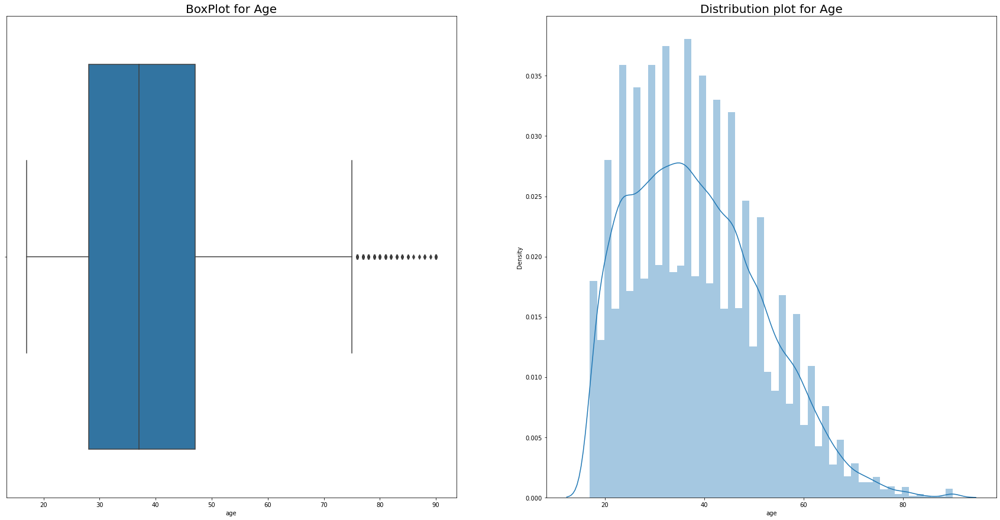

In [18]:
plt.figure(figsize=(30,15))

plt.subplot(121)
sns.boxplot(numericals['age'])
plt.title('BoxPlot for Age', fontdict={'fontsize': 20})
plt.xticks(fontsize = 10)

plt.subplot(122)
sns.distplot(numericals['age'])
plt.title('Distribution plot for Age', fontdict={'fontsize': 20})
plt.xticks(fontsize = 10)
plt.yticks(fontsize = 10)

From the above graphs we can tell that the average age of the individuals whose data we have in the dataset is around 35. The maximum age goes upto somewhere around 90. There exist a few outlier in the dataset, these are the individuals whose age is greater than 80 years.  
From the distribution plot it is clear that the most common age amongst the individuals is around 40.

(array([0.e+00, 1.e-06, 2.e-06, 3.e-06, 4.e-06, 5.e-06, 6.e-06]),
 <a list of 7 Text major ticklabel objects>)

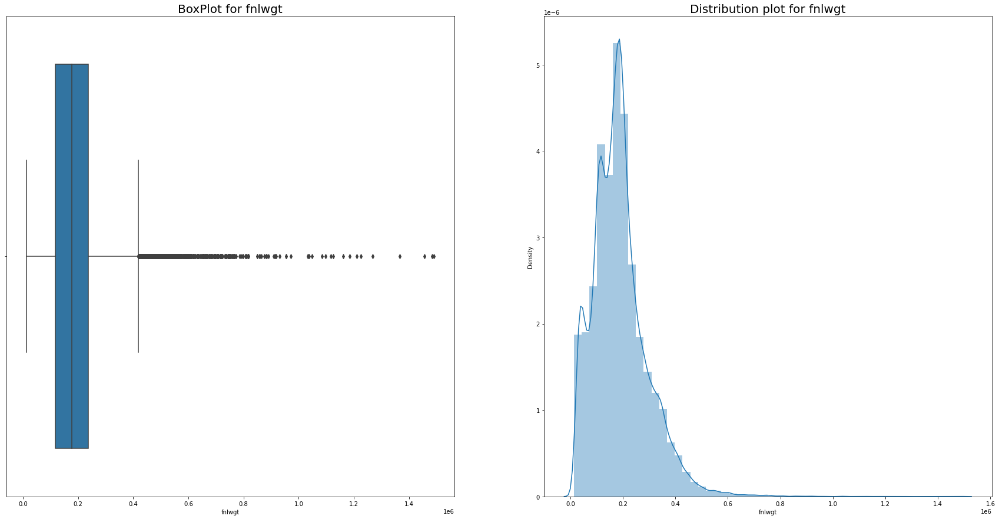

In [19]:
plt.figure(figsize=(30,15))

plt.subplot(121)
sns.boxplot(numericals['fnlwgt'])
plt.title('BoxPlot for fnlwgt', fontdict={'fontsize': 20})
plt.xticks(fontsize = 10)

plt.subplot(122)
sns.distplot(numericals['fnlwgt'])
plt.title('Distribution plot for fnlwgt', fontdict={'fontsize': 20})
plt.xticks(fontsize = 10)
plt.yticks(fontsize = 10)

The above plots indicate the presence of a number of outliers in this particular column. We can also observe that the average value in this column is around 200,000, this also happes to be the most common value as can be seen in the distribution plot.

(array([0. , 0.2, 0.4, 0.6, 0.8, 1. , 1.2]),
 <a list of 7 Text major ticklabel objects>)

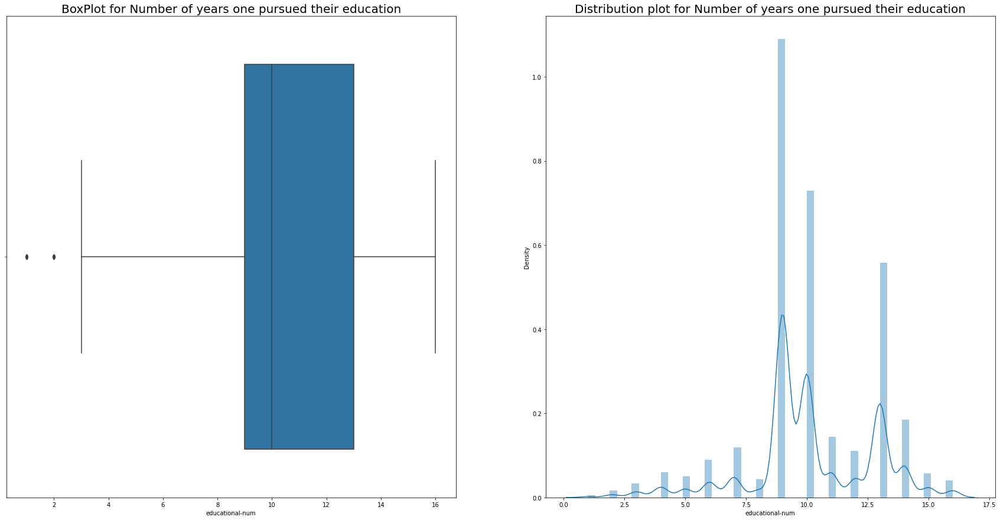

In [20]:
plt.figure(figsize=(30,15))

plt.subplot(121)
sns.boxplot(numericals['educational-num'])
plt.title('BoxPlot for Number of years one pursued their education', fontdict={'fontsize': 20})
plt.xticks(fontsize = 10)

plt.subplot(122)
sns.distplot(numericals['educational-num'])
plt.title('Distribution plot for Number of years one pursued their education', fontdict={'fontsize': 20})
plt.xticks(fontsize = 10)
plt.yticks(fontsize = 10)

It can be inferred from the above plots that the average number of years an individual pursued his or her education for is 10, with the maximum number of years being capped at 16 and the minimum being less than 2. We can also observe from the distribution plot that individuals have pursued their education for around 9 years most commonly.

(array([0.  , 0.05, 0.1 , 0.15, 0.2 , 0.25, 0.3 ]),
 <a list of 7 Text major ticklabel objects>)

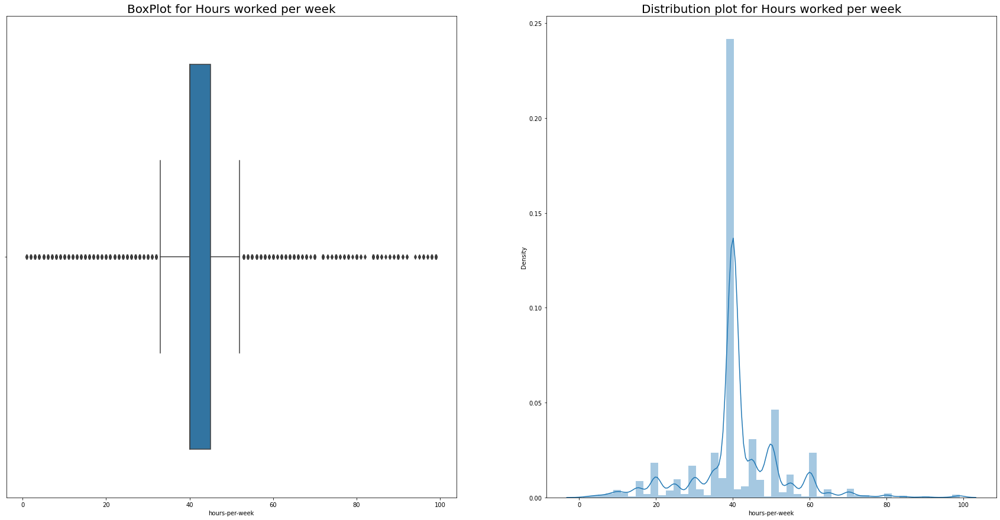

In [21]:
plt.figure(figsize=(30,15))

plt.subplot(121)
sns.boxplot(numericals['hours-per-week'])
plt.title('BoxPlot for Hours worked per week', fontdict={'fontsize': 20})
plt.xticks(fontsize = 10)

plt.subplot(122)
sns.distplot(numericals['hours-per-week'])
plt.title('Distribution plot for Hours worked per week', fontdict={'fontsize': 20})
plt.xticks(fontsize = 10)
plt.yticks(fontsize = 10)

The plots above indicate the number of hours worked by individuals per week. It can be seen that on average an individual works for about 40 hours per week. A number of outliers can be seen in the above plots, these are the individuals who either work for less that around 30 hours or more than about 50 hours. It can also be seen from the distribution plot that majority of the individuals work for 40 hours per week.

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f99fb185b50>,
      dtype=object)

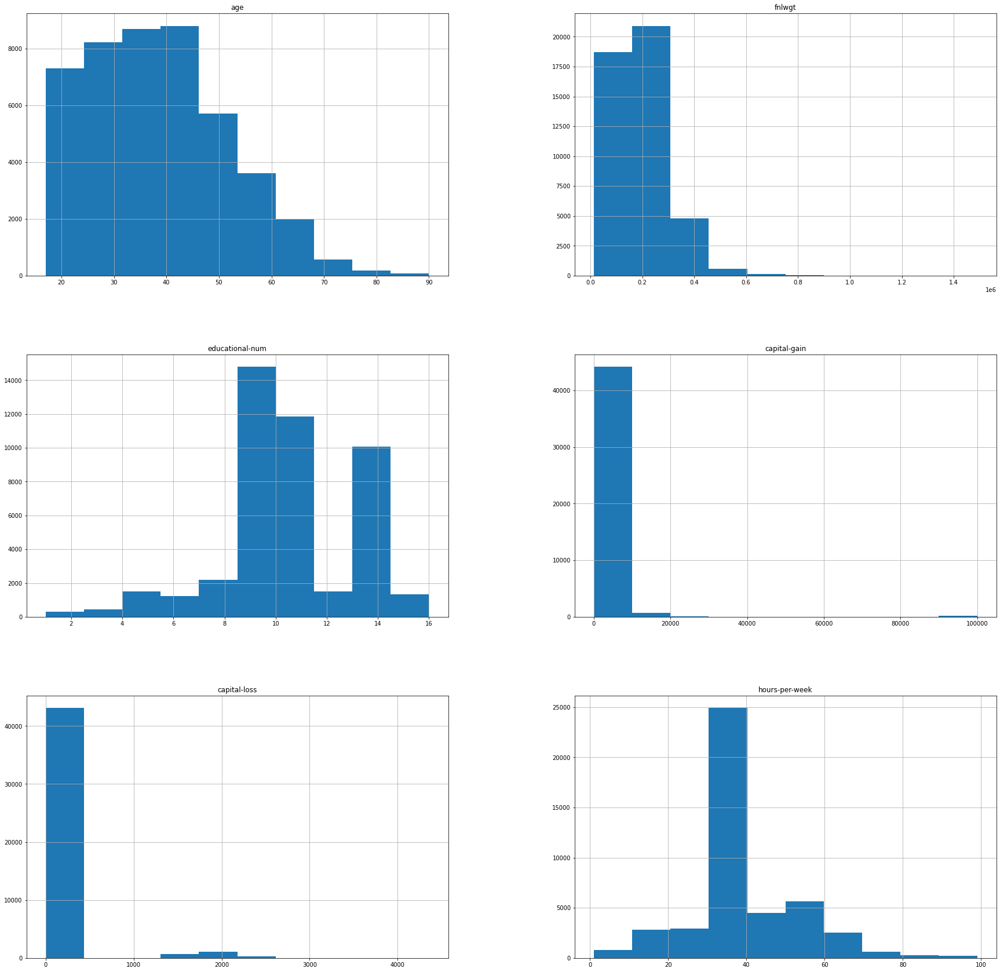

In [22]:
numericals.hist(figsize=(30,30))

The above plot gives us the histograms for all the numerical columns.

## Univariate Analysis (Categorical Columns)

In [23]:
plt.figure(figsize=(300,100))
sns.countplot(x='workclass', data = categoricals)
plt.xticks(fontsize=200)
plt.xticks(rotation=50)
plt.yticks(fontsize=200)

(array([    0.,  5000., 10000., 15000., 20000., 25000., 30000., 35000.]),
 <a list of 8 Text major ticklabel objects>)

We can see that maximum number of individuals are employed in the private sector of the industry. The least number of people are employed without any pay.

In [24]:
plt.figure(figsize=(300,100))
sns.countplot(x='education', data = categoricals)
plt.xticks(fontsize=200)
plt.xticks(rotation=50)
plt.yticks(fontsize=200)

(array([    0.,  2000.,  4000.,  6000.,  8000., 10000., 12000., 14000.,
        16000.]), <a list of 9 Text major ticklabel objects>)

In [25]:
plt.figure(figsize=(300,100))
sns.countplot(x='marital-status', data = categoricals)
plt.xticks(fontsize=200)
plt.xticks(rotation=50)
plt.yticks(fontsize=200)

(array([    0.,  2500.,  5000.,  7500., 10000., 12500., 15000., 17500.,
        20000., 22500.]), <a list of 10 Text major ticklabel objects>)

In [26]:
plt.figure(figsize=(300,100))
sns.countplot(x='occupation', data = categoricals)
plt.xticks(fontsize=200)
plt.xticks(rotation=50)
plt.yticks(fontsize=200)

(array([   0., 1000., 2000., 3000., 4000., 5000., 6000., 7000.]),
 <a list of 8 Text major ticklabel objects>)

In [27]:
plt.figure(figsize=(300,100))
sns.countplot(x='race', data = categoricals)
plt.xticks(fontsize=200)
plt.xticks(rotation=50)
plt.yticks(fontsize=200)

(array([    0.,  5000., 10000., 15000., 20000., 25000., 30000., 35000.,
        40000., 45000.]), <a list of 10 Text major ticklabel objects>)

In [28]:
plt.figure(figsize=(300,100))
sns.countplot(x='gender', data = categoricals)
plt.xticks(fontsize=200)
plt.xticks(rotation=50)
plt.yticks(fontsize=200)

(array([    0.,  5000., 10000., 15000., 20000., 25000., 30000., 35000.]),
 <a list of 8 Text major ticklabel objects>)

In [29]:
plt.figure(figsize=(300,100))
sns.countplot(x='relationship', data = categoricals)
plt.xticks(fontsize=200)
plt.xticks(rotation=50)
plt.yticks(fontsize=200)

(array([    0.,  2500.,  5000.,  7500., 10000., 12500., 15000., 17500.,
        20000.]), <a list of 9 Text major ticklabel objects>)

In [30]:
plt.figure(figsize=(300,100))
sns.countplot(x='native-country', data = categoricals)
plt.xticks(fontsize=200)
plt.xticks(rotation=50)
plt.yticks(fontsize=200)

(array([    0.,  5000., 10000., 15000., 20000., 25000., 30000., 35000.,
        40000., 45000.]), <a list of 10 Text major ticklabel objects>)

In [31]:
plt.figure(figsize=(300,100))
sns.countplot(x='income', data = categoricals)
plt.xticks(fontsize=200)
plt.xticks(rotation=50)
plt.yticks(fontsize=200)

(array([    0.,  5000., 10000., 15000., 20000., 25000., 30000., 35000.,
        40000.]), <a list of 9 Text major ticklabel objects>)

## Bivariate Analysis 

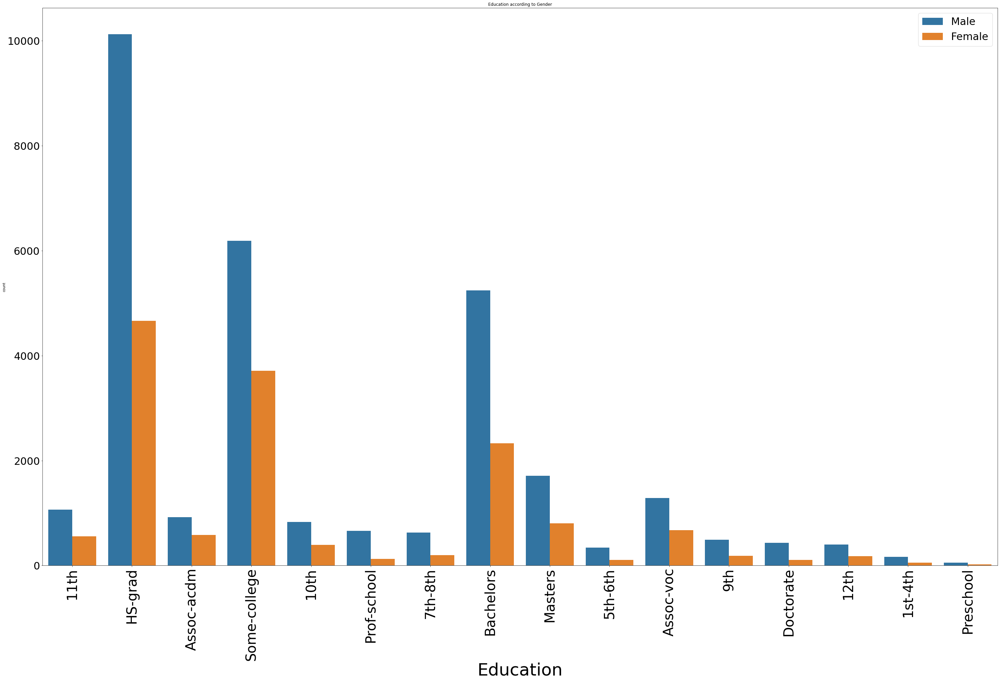

In [32]:
plt.figure(figsize=(50, 30))
sns.countplot(x='education', data=categoricals, hue='gender')
plt.title('Education according to Gender')
plt.xticks(fontsize=40)
plt.xticks(rotation=90)
plt.yticks(fontsize=30)
plt.xlabel('Education', fontsize= 50)
plt.legend(fontsize=30)

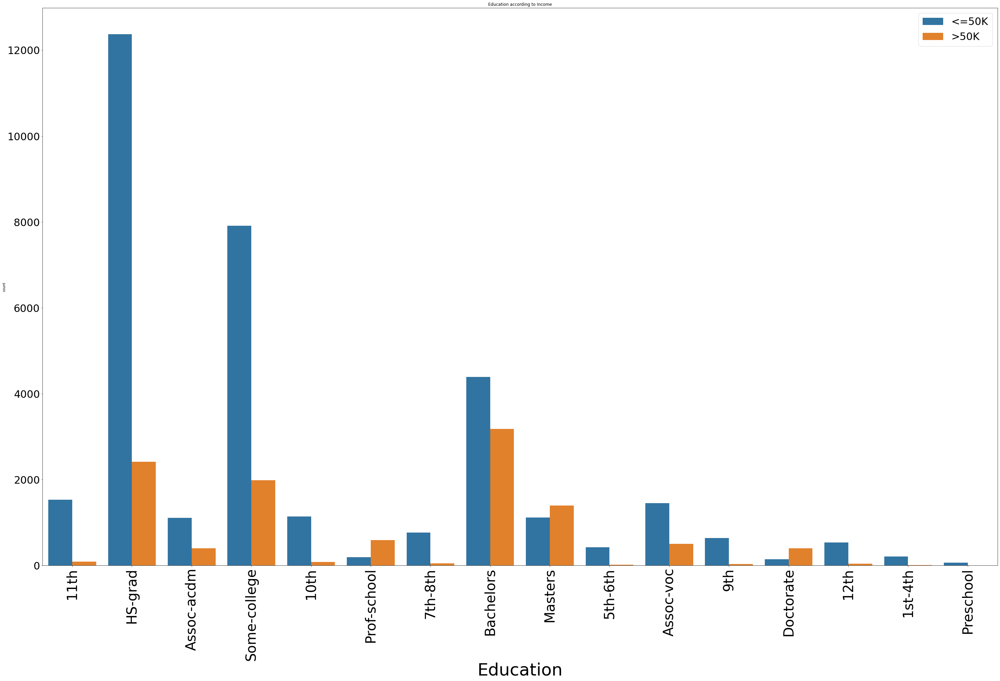

In [33]:
plt.figure(figsize=(50, 30))
sns.countplot(x='education', data=categoricals, hue='income')
plt.title('Education according to Income')
plt.xticks(fontsize=40)
plt.xticks(rotation=90)
plt.yticks(fontsize=30)
plt.xlabel('Education', fontsize= 50)
plt.legend(fontsize=30)

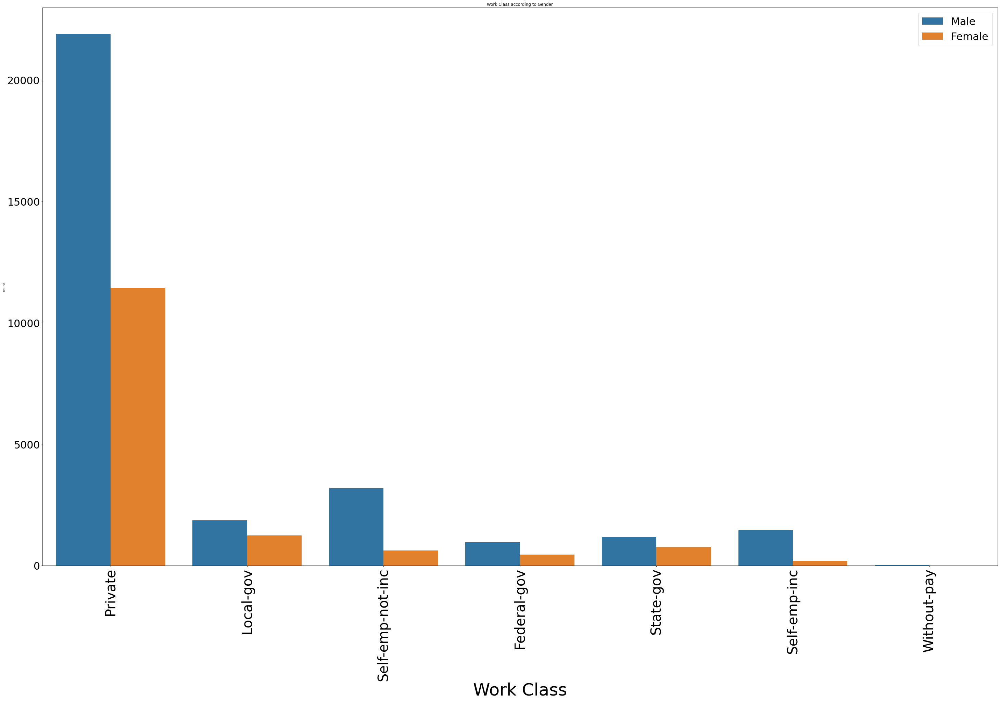

In [34]:
plt.figure(figsize=(50, 30))
sns.countplot(x='workclass', data=categoricals, hue='gender')
plt.title('Work Class according to Gender')
plt.xticks(fontsize=40)
plt.xticks(rotation=90)
plt.yticks(fontsize=30)
plt.xlabel('Work Class', fontsize= 50)
plt.legend(fontsize=30)

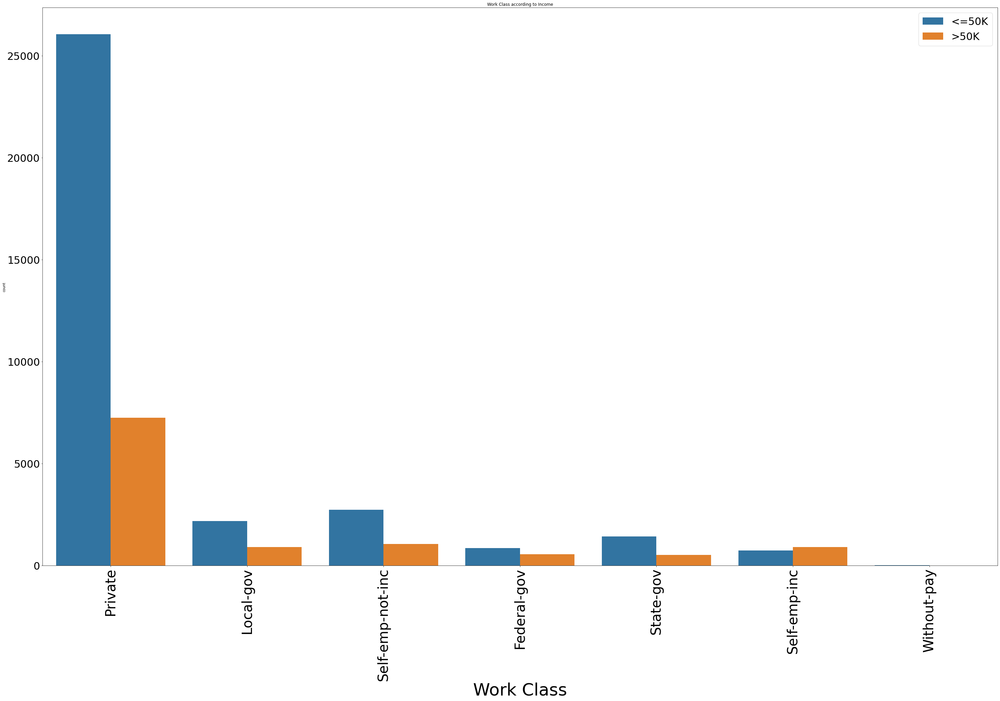

In [35]:
plt.figure(figsize=(50, 30))
sns.countplot(x='workclass', data=categoricals, hue='income')
plt.title('Work Class according to Income')
plt.xticks(fontsize=40)
plt.xticks(rotation=90)
plt.yticks(fontsize=30)
plt.xlabel('Work Class', fontsize= 50)
plt.legend(fontsize=30)

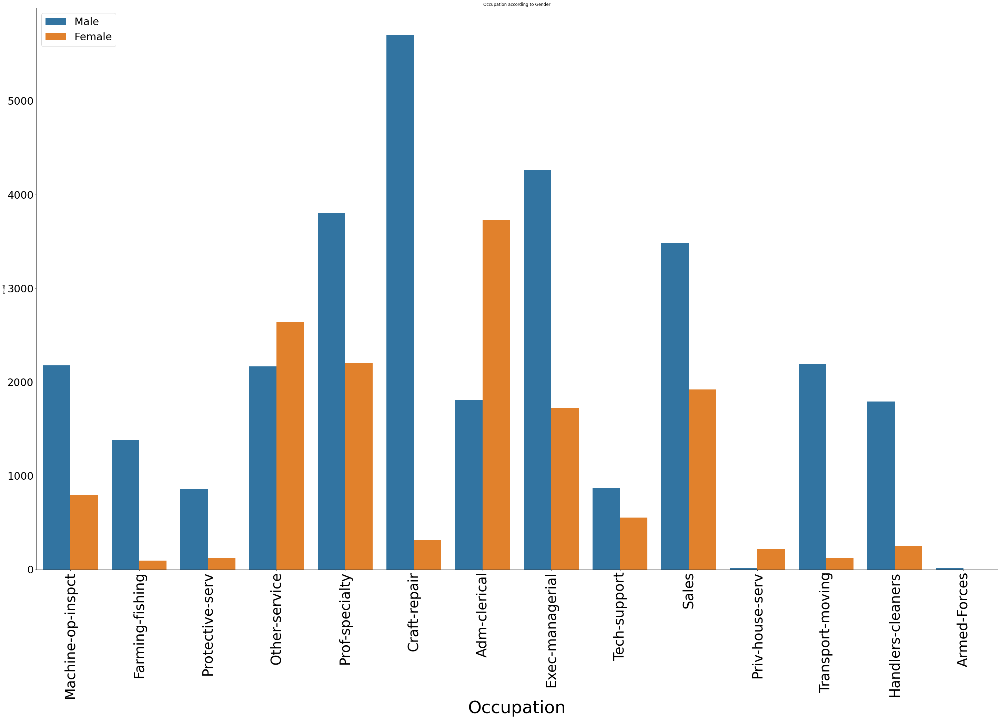

In [36]:
plt.figure(figsize=(50, 30))
sns.countplot(x='occupation', data=categoricals, hue='gender')
plt.title('Occupation according to Gender')
plt.xticks(fontsize=40)
plt.xticks(rotation=90)
plt.yticks(fontsize=30)
plt.xlabel('Occupation', fontsize= 50)
plt.legend(fontsize=30)

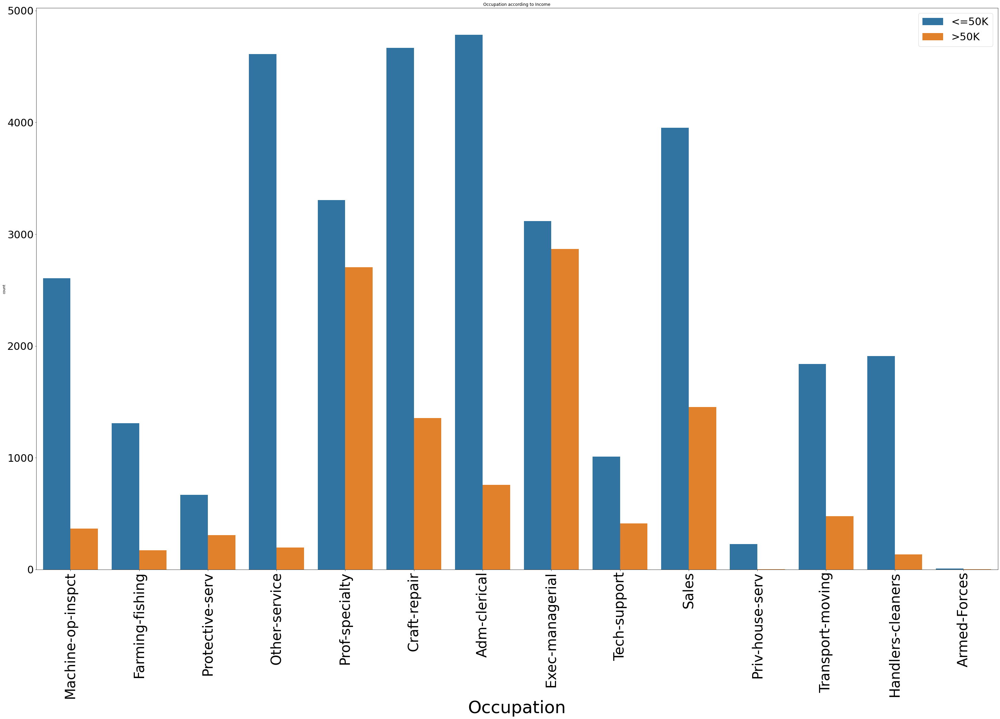

In [37]:
plt.figure(figsize=(50, 30))
sns.countplot(x='occupation', data=categoricals, hue='income')
plt.title('Occupation according to Income')
plt.xticks(fontsize=40)
plt.xticks(rotation=90)
plt.yticks(fontsize=30)
plt.xlabel('Occupation', fontsize= 50)
plt.legend(fontsize=30)

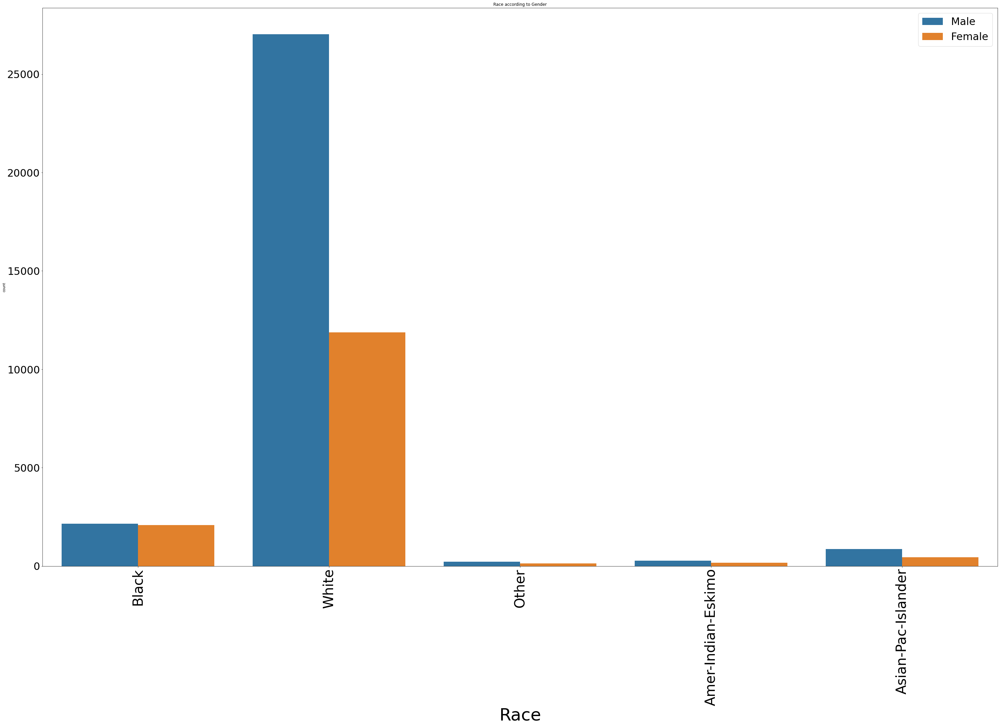

In [38]:
plt.figure(figsize=(50, 30))
sns.countplot(x='race', data=categoricals, hue='gender')
plt.title('Race according to Gender')
plt.xticks(fontsize=40)
plt.xticks(rotation=90)
plt.yticks(fontsize=30)
plt.xlabel('Race', fontsize= 50)
plt.legend(fontsize=30)

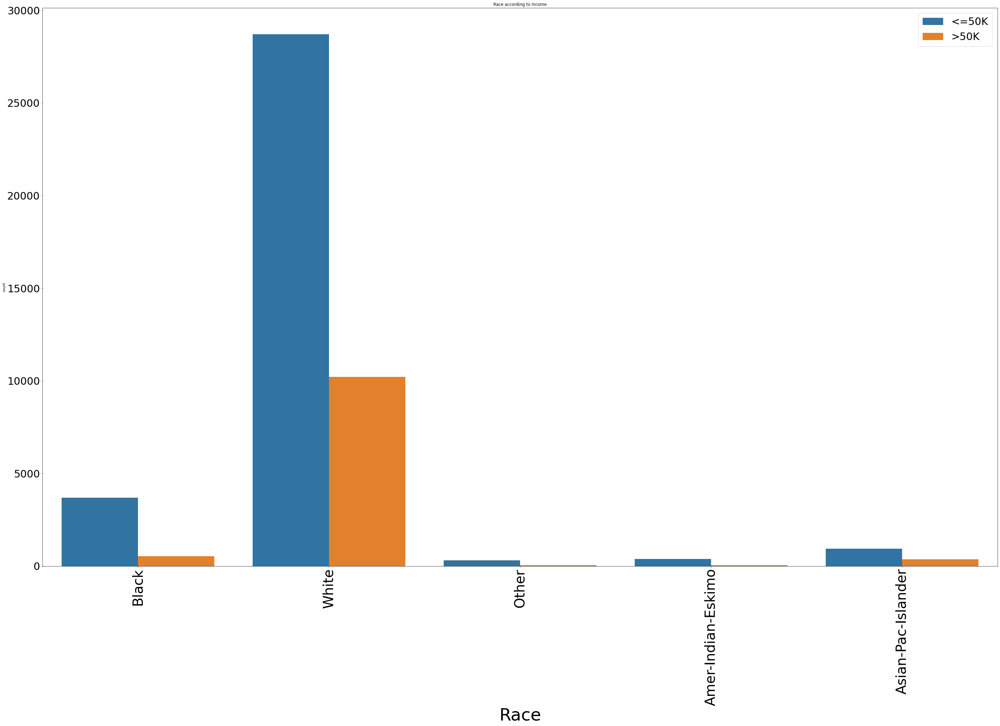

In [39]:
plt.figure(figsize=(50, 30))
sns.countplot(x='race', data=categoricals, hue='income')
plt.title('Race according to Income')
plt.xticks(fontsize=40)
plt.xticks(rotation=90)
plt.yticks(fontsize=30)
plt.xlabel('Race', fontsize= 50)
plt.legend(fontsize=30)

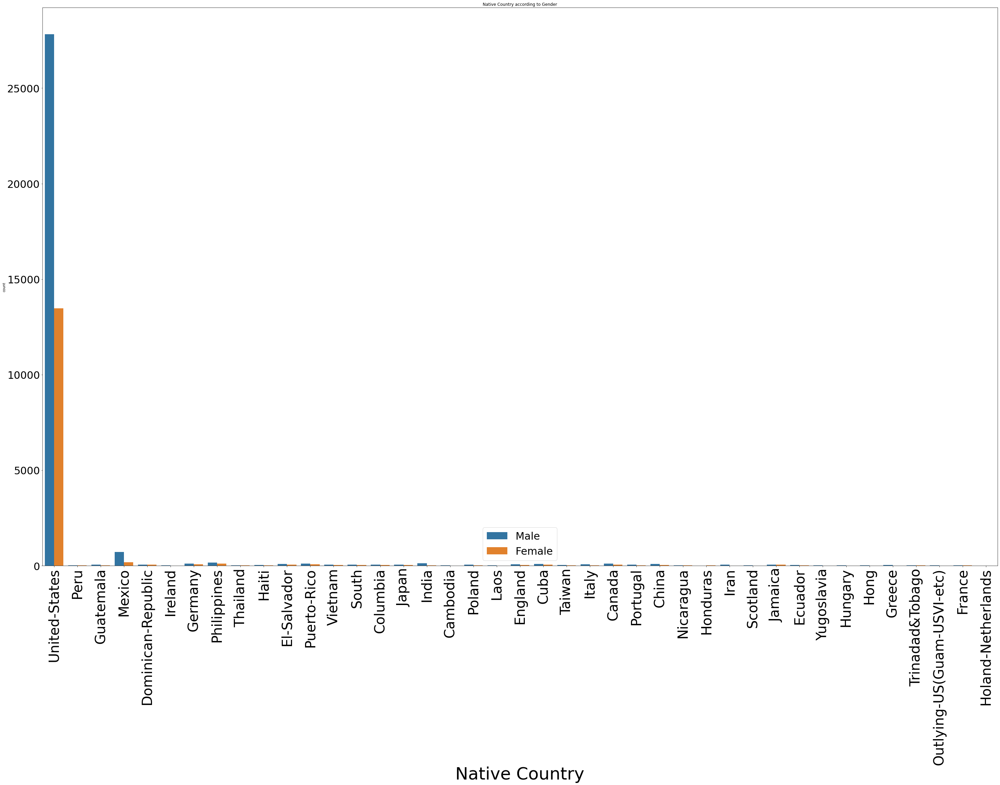

In [40]:
plt.figure(figsize=(50, 30))
sns.countplot(x='native-country', data=categoricals, hue='gender')
plt.title('Native Country according to Gender')
plt.xticks(fontsize=40)
plt.xticks(rotation=90)
plt.yticks(fontsize=30)
plt.xlabel('Native Country', fontsize= 50)
plt.legend(fontsize=30)

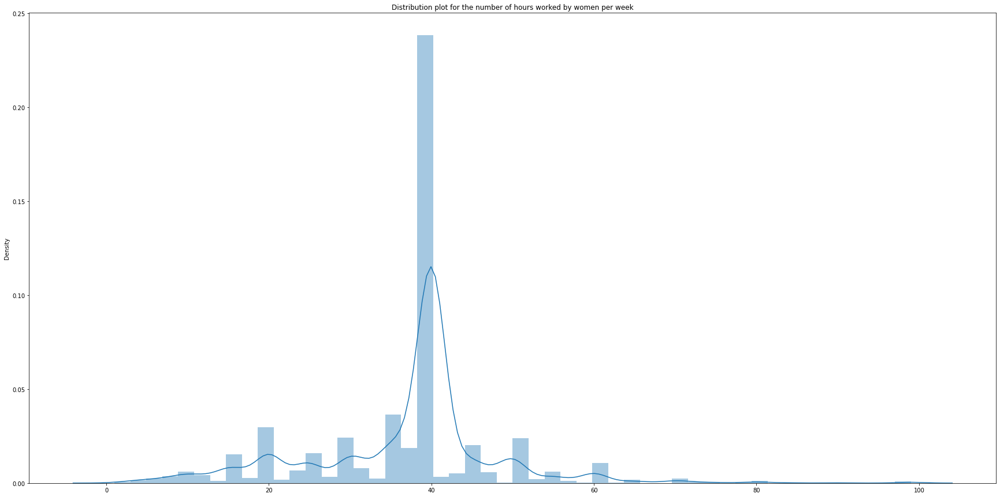

In [41]:
plt.figure(figsize=(30,15))

sns.distplot(data.loc[data['gender'] == 'Female', ['hours-per-week']])
plt.title('Distribution plot for the number of hours worked by women per week')

plt.show()

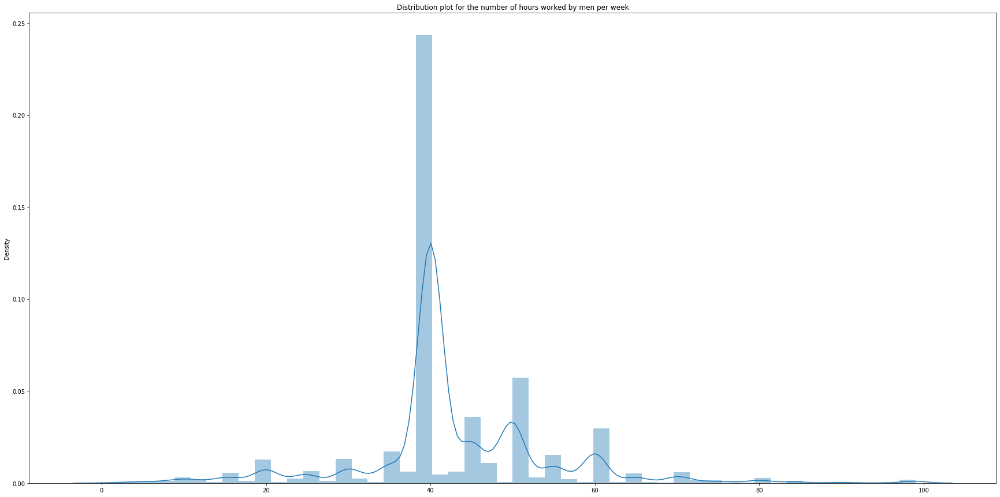

In [42]:
plt.figure(figsize=(30,15))

sns.distplot(data.loc[data['gender'] == 'Male', ['hours-per-week']])
plt.title('Distribution plot for the number of hours worked by men per week')

plt.show()

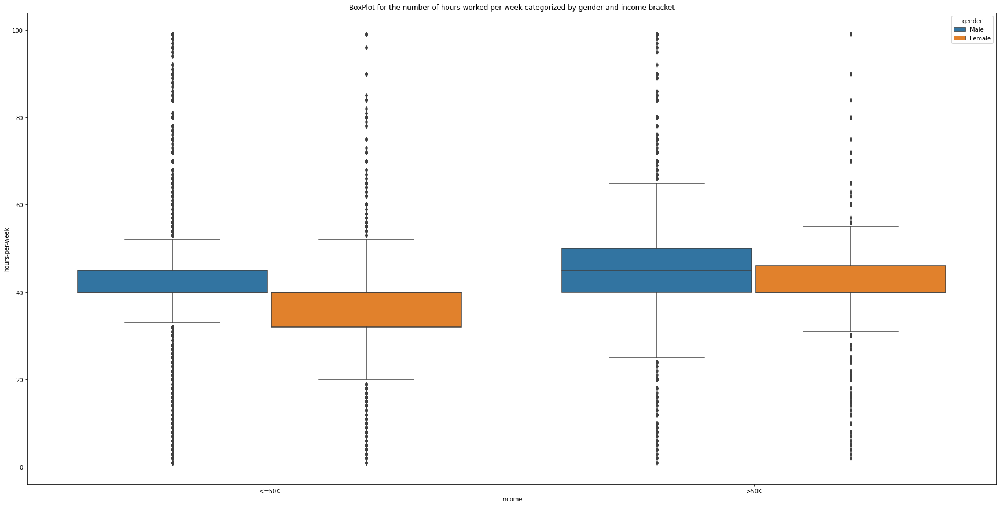

In [43]:
plt.figure(figsize = (30,15))

sns.boxplot(y = 'hours-per-week', data = data, x = 'income', hue = 'gender')
plt.title('BoxPlot for the number of hours worked per week categorized by gender and income bracket')

plt.show()

In [44]:
data['income_category'] = "null"
data.loc[data['income'] == '<=50K', ['income_category']] = 'low income'
data.loc[data['income'] == '>50K', ['income_category']] = 'high income'
data.loc[:, 'income_category'].head()

0     low income
1     low income
2    high income
3    high income
5     low income
Name: income_category, dtype: object

In [45]:
race_income = data.pivot_table(values = ['income_category'], index = ['income', 'race'], aggfunc = 'count')
race_income

income_category
income race                               
<=50K  Amer-Indian-Eskimo              382
       Asian-Pac-Islander              934
       Black                          3694
       Other                           308
       White                         28696
>50K   Amer-Indian-Eskimo               53
       Asian-Pac-Islander              369
       Black                           534
       Other                            45
       White                         10207

In [46]:
race_income_gender = data.pivot_table(values = ['income_category'], index = ['income', 'race', 'gender'], aggfunc = 'count')
race_income_gender

income_category
income race               gender                 
<=50K  Amer-Indian-Eskimo Female              152
                          Male                230
       Asian-Pac-Islander Female              371
                          Male                563
       Black              Female             1958
                          Male               1736
       Other              Female              117
                          Male                191
       White              Female            10428
                          Male              18268
>50K   Amer-Indian-Eskimo Female               14
                          Male                 39
       Asian-Pac-Islander Female               65
                          Male                304
       Black              Female              126
                          Male                408
       Other              Female                9
                          Male                 36
       White              Female             1455
                          Male               8752

In [47]:
marital_income = data.pivot_table(values = ['income'], index = ['marital-status'], aggfunc = 'count')
marital_income

,income
marital-status,
Divorced,6297
Married-AF-spouse,32
Married-civ-spouse,21055
Married-spouse-absent,552
Never-married,14598
Separated,1411
Widowed,1277


In [48]:
marital_income_gender = data.pivot_table(values = ['income'], index = ['marital-status', 'gender'], aggfunc = 'count')
marital_income_gender

income
marital-status        gender        
Divorced              Female    3785
                      Male      2512
Married-AF-spouse     Female      21
                      Male        11
Married-civ-spouse    Female    2213
                      Male     18842
Married-spouse-absent Female     274
                      Male       278
Never-married         Female    6513
                      Male      8085
Separated             Female     852
                      Male       559
Widowed               Female    1037
                      Male       240

In [49]:
marital_income_category = data.pivot_table(values = ['income_category'], index = ['income', 'marital-status', 'gender'], aggfunc = 'count')
marital_income_category

income_category
income marital-status        gender                 
<=50K  Divorced              Female             3518
                             Male               2124
       Married-AF-spouse     Female               11
                             Male                  7
       Married-civ-spouse    Female             1183
                             Male              10308
       Married-spouse-absent Female              256
                             Male                242
       Never-married         Female             6259
                             Male               7638
       Separated             Female              824
                             Male                488
       Widowed               Female              975
                             Male                181
>50K   Divorced              Female              267
                             Male                388
       Married-AF-spouse     Female               10
                             Male                  4
       Married-civ-spouse    Female             1030
                             Male               8534
       Married-spouse-absent Female               18
                             Male                 36
       Never-married         Female              254
                             Male                447
       Separated             Female               28
                             Male                 71
       Widowed               Female               62
                             Male                 59

In [50]:
race_income = data.pivot_table(values = ['income'], index = ['race'], aggfunc = 'count')
race_income['percentage'] = round(race_income['income'] * 100 / race_income['income'].sum(), 2)
race_income

,income,percentage
race,,
Amer-Indian-Eskimo,435,0.96
Asian-Pac-Islander,1303,2.88
Black,4228,9.35
Other,353,0.78
White,38903,86.03


In [51]:
race_income = data.pivot_table(values = ['income'], index = ['race', 'gender'], aggfunc = 'count')
race_income['percentage'] = round(race_income['income'] * 100 / race_income['income'].sum(), 2)
race_income

income  percentage
race               gender                    
Amer-Indian-Eskimo Female     166        0.37
                   Male       269        0.59
Asian-Pac-Islander Female     436        0.96
                   Male       867        1.92
Black              Female    2084        4.61
                   Male      2144        4.74
Other              Female     126        0.28
                   Male       227        0.50
White              Female   11883       26.28
                   Male     27020       59.75

In [52]:
country_income = data.pivot_table(values = ['income'], index = ['native-country'], aggfunc = 'count')
country_income['percentage'] = round(country_income['income'] * 100 / country_income['income'].sum(), 2)
country_income

,income,percentage
native-country,,
Cambodia,26,0.06
Canada,163,0.36
China,113,0.25
Columbia,82,0.18
Cuba,133,0.29
Dominican-Republic,97,0.21
Ecuador,43,0.10
El-Salvador,147,0.33
England,119,0.26


## Data Preparation
### Removal of Unnecessary Columns

In [53]:
data.columns

Index(['age', 'workclass', 'fnlwgt', 'education', 'educational-num',
       'marital-status', 'occupation', 'relationship', 'race', 'gender',
       'capital-gain', 'capital-loss', 'hours-per-week', 'native-country',
       'income', 'income_category'],
      dtype='object')

In [54]:
data.drop(labels = ['fnlwgt', 'education'], axis = 1, inplace = True)

### Removal of Outliers
**What is an Outlier?**  
Outliers are data points that are far from other data points. In other words, they're unusual calues in a dataset. Outliers are problematic for many statistical analyses because they can cause tests to either miss significant findings or distort real results.  
**Cause for Outliers**
* Data Entry Errors - Human errors such as errors caused during data collection, recording, or entry can cause outliers in data.
* Measurement Errors - It is the most common source of outliers. This is caused when the measurement instrument used turns out to be faulty.
* Natural Outlier - When an outlier is not artificial (due to error), it is a natural outlier. Most of the real world data belong to this category.  

### Using Z-Score method for Outlier Detection  
Using the Z-score method, we can find out how many standard deviations value away from the mean.  
* 68% of the data points lie between + or - 1 standard deviation.
* 95% of the data points lie between + or - 2 standard deviations.
* 99.7% of the data points lie between + or - 3 standard deviations.  

**Z-score Formula:**
$$\frac{X - Mean}{Standard Deviation}$$  
If the Z-score of a data point is more than 3 (because it covers 99.7% of the area), it indicates that the data value is quite different from the other values. It is taken as an outlier.

In [55]:
def zscore_outlier(df):
  outlier = []
  m = np.mean(df)
  sd = np.std(df)
  for i in df:
    z = (i - m) / sd
    if np.abs(z) > 3:
      outlier.append(i)
  print("Outliers: ", outlier)
  return outlier

In [56]:
age_outliers = zscore_outlier(data['age'])

Outliers:  [80, 90, 80, 81, 82, 81, 85, 80, 90, 81, 89, 83, 81, 82, 80, 90, 81, 83, 90, 90, 80, 80, 81, 90, 85, 90, 81, 81, 80, 79, 81, 80, 88, 87, 90, 79, 83, 79, 80, 79, 81, 81, 90, 82, 90, 81, 88, 80, 81, 80, 81, 90, 84, 80, 80, 83, 79, 79, 90, 81, 90, 88, 90, 90, 80, 90, 81, 81, 80, 90, 79, 81, 90, 90, 80, 90, 90, 79, 79, 84, 90, 80, 90, 81, 83, 84, 79, 85, 82, 79, 90, 90, 84, 80, 90, 90, 84, 90, 90, 90, 81, 82, 81, 80, 90, 80, 84, 82, 79, 90, 84, 90, 83, 80, 79, 80, 79, 80, 90, 90, 90, 81, 83, 90, 90, 81, 80, 80, 90, 79, 80, 82, 85, 80, 79, 90, 79, 81, 88, 90, 82, 88, 83, 79, 86, 90, 82, 83, 81, 79, 84, 84, 79, 90, 80, 81, 81, 90, 80, 82, 90, 90, 85]


### Removing the Outliers by making use of Boxcox Transformation

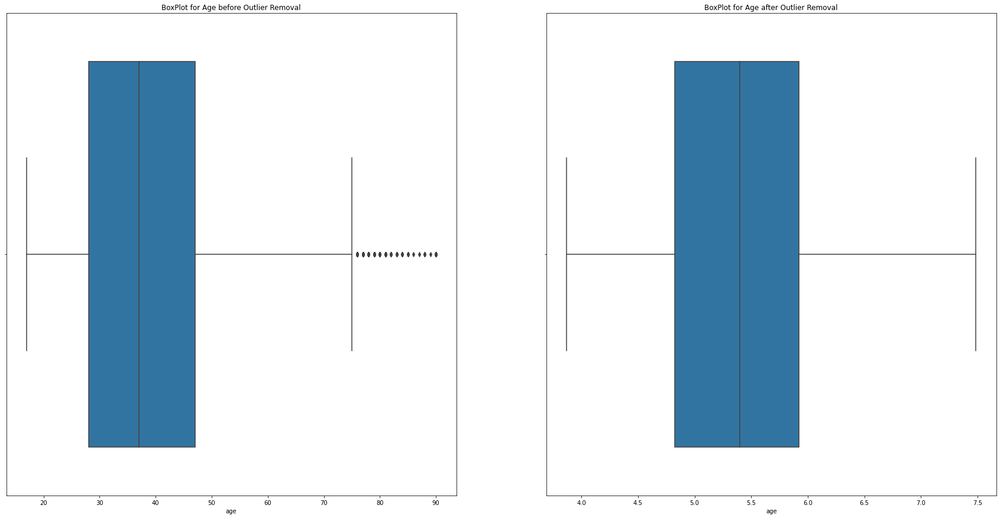

In [57]:
plt.figure(figsize = (30,15))

plt.subplot(121)
sns.boxplot(data['age'])
plt.title('BoxPlot for Age before Outlier Removal')

data['age'], fitted_lambda = scipy.stats.boxcox(data['age'], lmbda=None)

plt.subplot(122)
sns.boxplot(data['age'])
plt.title('BoxPlot for Age after Outlier Removal')

plt.show()

In [58]:
hours_outliers = zscore_outlier(data['hours-per-week'])

Outliers:  [90, 84, 80, 84, 80, 99, 80, 80, 96, 90, 3, 1, 99, 80, 80, 84, 99, 2, 4, 78, 80, 99, 84, 80, 3, 80, 80, 80, 99, 92, 3, 80, 84, 77, 99, 80, 84, 85, 4, 99, 4, 2, 84, 80, 99, 98, 84, 77, 96, 4, 80, 90, 4, 78, 84, 80, 90, 80, 86, 80, 4, 84, 80, 99, 80, 85, 80, 80, 80, 80, 3, 4, 80, 84, 99, 4, 80, 84, 99, 99, 99, 99, 90, 80, 96, 2, 99, 99, 90, 99, 80, 88, 2, 80, 80, 90, 79, 4, 4, 78, 84, 2, 80, 84, 3, 4, 1, 84, 99, 89, 98, 80, 80, 90, 4, 80, 99, 80, 78, 99, 99, 80, 80, 80, 99, 80, 99, 99, 80, 80, 90, 80, 78, 84, 3, 80, 80, 1, 99, 99, 99, 80, 99, 88, 3, 4, 90, 80, 85, 84, 4, 3, 98, 80, 99, 80, 4, 99, 99, 1, 4, 99, 96, 84, 99, 80, 1, 77, 99, 99, 99, 84, 90, 2, 99, 99, 3, 85, 99, 3, 99, 80, 80, 99, 2, 99, 80, 4, 80, 99, 99, 80, 2, 80, 86, 80, 3, 80, 2, 84, 80, 80, 84, 80, 84, 4, 4, 80, 80, 80, 99, 80, 90, 4, 84, 92, 80, 80, 80, 84, 84, 80, 90, 80, 80, 80, 2, 1, 98, 80, 80, 80, 99, 80, 80, 99, 80, 80, 78, 90, 80, 80, 90, 84, 99, 80, 90, 84, 3, 98, 80, 85, 84, 80, 3, 84, 99, 80, 84, 8

### Imputing the Outliers

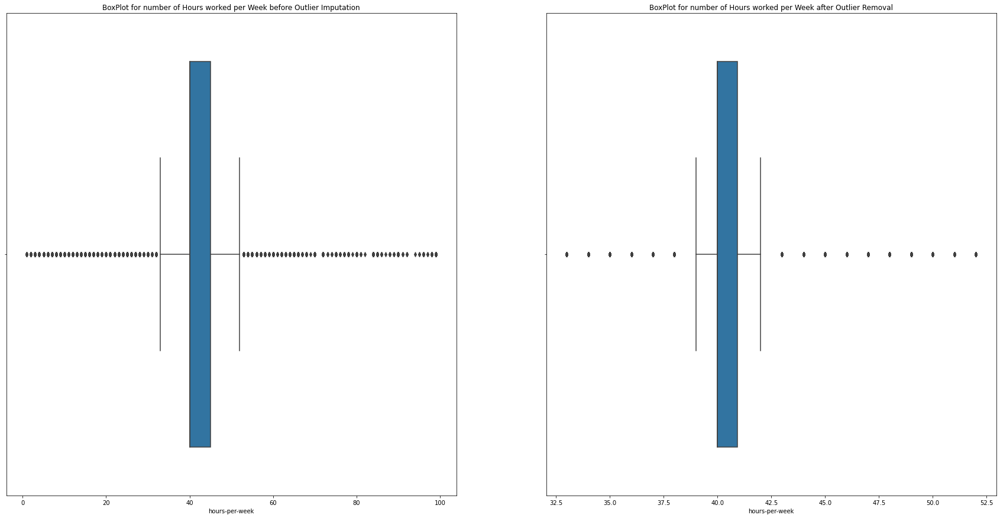

In [59]:
plt.figure(figsize = (30,15))

plt.subplot(121)
sns.boxplot(data['hours-per-week'])
plt.title('BoxPlot for number of Hours worked per Week before Outlier Imputation')

q1 = data['hours-per-week'].quantile(0.25)
q3 = data['hours-per-week'].quantile(0.75)
iqr = q3 - q1

lower_tail = q1 - 1.5 * iqr
upper_tail = q3 + 1.5 * iqr

m = np.mean(data['hours-per-week'])

for i in data['hours-per-week']:
  if i > upper_tail or i < lower_tail:
    data['hours-per-week'] = data['hours-per-week'].replace(i, m)

plt.subplot(122)
sns.boxplot(data['hours-per-week'])
plt.title('BoxPlot for number of Hours worked per Week after Outlier Removal')

plt.show()

In [60]:
data.drop('income_category', axis = 1, inplace = True)

In [61]:
numericals = data.select_dtypes(include = ['int64', 'float64'])
numericals.head()

,age,educational-num,capital-gain,capital-loss,hours-per-week
0,4.597951,7,0,0,40.000000
1,5.457768,9,0,0,50.000000
2,4.823266,12,0,0,40.000000
3,5.777119,10,7688,0,40.000000
5,5.221951,6,0,0,40.938017


In [62]:
categoricals = data.select_dtypes(include = ['object'])
categoricals.head()

,workclass,marital-status,occupation,relationship,race,gender,native-country,income
0,Private,Never-married,Machine-op-inspct,Own-child,Black,Male,United-States,<=50K
1,Private,Married-civ-spouse,Farming-fishing,Husband,White,Male,United-States,<=50K
2,Local-gov,Married-civ-spouse,Protective-serv,Husband,White,Male,United-States,>50K
3,Private,Married-civ-spouse,Machine-op-inspct,Husband,Black,Male,United-States,>50K
5,Private,Never-married,Other-service,Not-in-family,White,Male,United-States,<=50K


### Scaling the Numerical Features

In [63]:
scaler = StandardScaler()

data_num = pd.DataFrame(scaler.fit_transform(numericals), columns = numericals.columns)

data_num.head()

,age,educational-num,capital-gain,capital-loss,hours-per-week
0,-1.063919,-1.221559,-0.146733,-0.21878,-0.412015
1,0.094227,-0.438122,-0.146733,-0.21878,2.459530
2,-0.760426,0.737034,-0.146733,-0.21878,-0.412015
3,0.524383,-0.046403,0.877467,-0.21878,-0.412015
4,-0.223411,-1.613277,-0.146733,-0.21878,-0.142659


### One Hot Encoding the Categorical Columns

In [64]:
encoder = OneHotEncoder(drop = 'first', sparse = False)

data_cat = pd.DataFrame(encoder.fit_transform(categoricals), columns = encoder.get_feature_names(categoricals.columns))

data_cat.head()

,workclass_Local-gov,workclass_Private,workclass_Self-emp-inc,workclass_Self-emp-not-inc,workclass_State-gov,workclass_Without-pay,marital-status_Married-AF-spouse,marital-status_Married-civ-spouse,marital-status_Married-spouse-absent,marital-status_Never-married,marital-status_Separated,marital-status_Widowed,occupation_Armed-Forces,occupation_Craft-repair,occupation_Exec-managerial,occupation_Farming-fishing,occupation_Handlers-cleaners,occupation_Machine-op-inspct,occupation_Other-service,occupation_Priv-house-serv,occupation_Prof-specialty,occupation_Protective-serv,occupation_Sales,occupation_Tech-support,occupation_Transport-moving,relationship_Not-in-family,relationship_Other-relative,relationship_Own-child,relationship_Unmarried,relationship_Wife,race_Asian-Pac-Islander,race_Black,race_Other,race_White,gender_Male,native-country_Canada,native-country_China,native-country_Columbia,native-country_Cuba,native-country_Dominican-Republic,native-country_Ecuador,native-country_El-Salvador,native-country_England,native-country_France,native-country_Germany,native-country_Greece,native-country_Guatemala,native-country_Haiti,native-country_Holand-Netherlands,native-country_Honduras,native-country_Hong,native-country_Hungary,native-country_India,native-country_Iran,native-country_Ireland,native-country_Italy,native-country_Jamaica,native-country_Japan,native-country_Laos,native-country_Mexico,native-country_Nicaragua,native-country_Outlying-US(Guam-USVI-etc),native-country_Peru,native-country_Philippines,native-country_Poland,native-country_Portugal,native-country_Puerto-Rico,native-country_Scotland,native-country_South,native-country_Taiwan,native-country_Thailand,native-country_Trinadad&Tobago,native-country_United-States,native-country_Vietnam,native-country_Yugoslavia,income_>50K
0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
1,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
2,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
3,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
4,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


In [65]:
data_new = pd.concat([data_num, data_cat], axis = 1)
data_new.head()

,age,educational-num,capital-gain,capital-loss,hours-per-week,workclass_Local-gov,workclass_Private,workclass_Self-emp-inc,workclass_Self-emp-not-inc,workclass_State-gov,workclass_Without-pay,marital-status_Married-AF-spouse,marital-status_Married-civ-spouse,marital-status_Married-spouse-absent,marital-status_Never-married,marital-status_Separated,marital-status_Widowed,occupation_Armed-Forces,occupation_Craft-repair,occupation_Exec-managerial,occupation_Farming-fishing,occupation_Handlers-cleaners,occupation_Machine-op-inspct,occupation_Other-service,occupation_Priv-house-serv,occupation_Prof-specialty,occupation_Protective-serv,occupation_Sales,occupation_Tech-support,occupation_Transport-moving,relationship_Not-in-family,relationship_Other-relative,relationship_Own-child,relationship_Unmarried,relationship_Wife,race_Asian-Pac-Islander,race_Black,race_Other,race_White,gender_Male,...,native-country_China,native-country_Columbia,native-country_Cuba,native-country_Dominican-Republic,native-country_Ecuador,native-country_El-Salvador,native-country_England,native-country_France,native-country_Germany,native-country_Greece,native-country_Guatemala,native-country_Haiti,native-country_Holand-Netherlands,native-country_Honduras,native-country_Hong,native-country_Hungary,native-country_India,native-country_Iran,native-country_Ireland,native-country_Italy,native-country_Jamaica,native-country_Japan,native-country_Laos,native-country_Mexico,native-country_Nicaragua,native-country_Outlying-US(Guam-USVI-etc),native-country_Peru,native-country_Philippines,native-country_Poland,native-country_Portugal,native-country_Puerto-Rico,native-country_Scotland,native-country_South,native-country_Taiwan,native-country_Thailand,native-country_Trinadad&Tobago,native-country_United-States,native-country_Vietnam,native-country_Yugoslavia,income_>50K
0,-1.063919,-1.221559,-0.146733,-0.21878,-0.412015,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
1,0.094227,-0.438122,-0.146733,-0.21878,2.459530,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
2,-0.760426,0.737034,-0.146733,-0.21878,-0.412015,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
3,0.524383,-0.046403,0.877467,-0.21878,-0.412015,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
4,-0.223411,-1.613277,-0.146733,-0.21878,-0.142659,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


### Splitting the Data

In [66]:
y = data_new.pop('income_>50K')
x = data_new

In [67]:
x_train, x_test, y_train, y_test = train_test_split(x, y, train_size = 0.7, random_state = 100)

In [68]:
print(x_train.shape, y_train.shape)
print(x_test.shape, y_test.shape)

(31655, 80) (31655,)
(13567, 80) (13567,)


## Classification Models
### Logistic Regression
#### Training the Model

In [69]:
lr_model = LogisticRegression()

lr_model.fit(x_train, y_train)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [70]:
y_test_pred = lr_model.predict(x_test)

#### Evaluating the Model

In [71]:
metrics.accuracy_score(y_test, y_test_pred)

0.8474976044814624

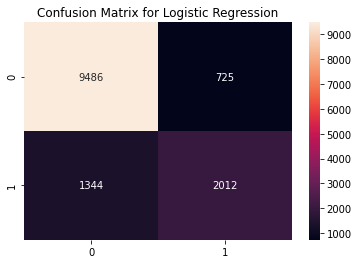

In [72]:
sns.heatmap(metrics.confusion_matrix(y_test, y_test_pred), annot = True, fmt = 'd')
plt.title('Confusion Matrix for Logistic Regression')

plt.show()

In [73]:
print(metrics.classification_report(y_test, y_test_pred))

              precision    recall  f1-score   support

         0.0       0.88      0.93      0.90     10211
         1.0       0.74      0.60      0.66      3356

    accuracy                           0.85     13567
   macro avg       0.81      0.76      0.78     13567
weighted avg       0.84      0.85      0.84     13567



In [74]:
prob = lr_model.predict_proba(x_test)
prob = prob[:, 1]
roc_auc = metrics.roc_auc_score(y_test, prob)
print(roc_auc)

0.9032867899711791


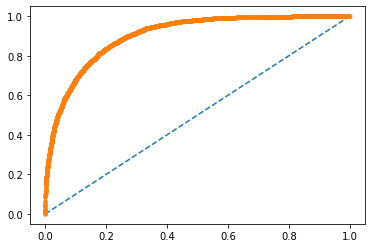

In [75]:
fpr, tpr, thresholds = metrics.roc_curve(y_test, prob)

plt.plot([0,1], [0,1], linestyle = '--')

plt.plot(fpr, tpr, marker = '.')

plt.show()

### Defining a Function for Training the Models

In [76]:
def train(algo, x_train, y_train, x_test, y_test):
  algo.fit(x_train, y_train)
  y_test_pred = algo.predict(x_test)
  return y_test_pred

### Defining a Function for Evaluating the Models

In [86]:
def evaluate(algo, name, x_test, y_test, y_test_pred):
  #Calculating the Accuracy score
  score = metrics.accuracy_score(y_test, y_test_pred)
  print('Accuracy score for ', name, ' is ', score)

  #Plotting the Confusion Matrix
  sns.heatmap(metrics.confusion_matrix(y_test, y_test_pred), annot = True, fmt = 'd')
  plt.title('Confusion Matrix')

  plt.show()

  #Printing the Classification Report
  print(metrics.classification_report(y_test, y_test_pred))

  #Calculating the ROC AUC Score
  prob = algo.predict_proba(x_test)
  prob = prob[:, 1]
  roc_auc = metrics.roc_auc_score(y_test, prob)
  print(roc_auc)

  #Plotting the ROC AUC Curve
  fpr, tpr, thresholds = metrics.roc_curve(y_test, prob)
  plt.plot([0,1], [0,1], linestyle = '--')
  plt.plot(fpr, tpr, marker = '.')
  plt.title('ROC AUC Curve')

  plt.show()

  return roc_auc, score

In [87]:
logr_model = LogisticRegression()
svc_model = svm.SVC(probability=True)
dt_model = DecisionTreeClassifier()
rf_model = RandomForestClassifier()

In [88]:
models = ['Logistic Regression', 'Support Vector Classifier', 'Decision Tree Classifier', 'Random Forest Classifier']
algos = {logr_model: 'Logistic Regression', svc_model: 'Support Vector Classifier', dt_model: 'Decision Tree Classifier', rf_model: 'Random Forest Classifier'}

---------------------------------------- Logistic Regression ----------------------------------------
Accuracy score for  Logistic Regression  is  0.8474976044814624


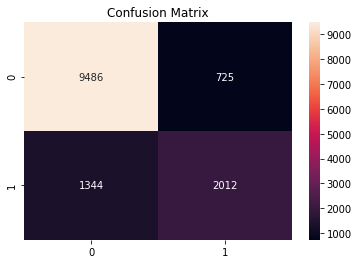

              precision    recall  f1-score   support

         0.0       0.88      0.93      0.90     10211
         1.0       0.74      0.60      0.66      3356

    accuracy                           0.85     13567
   macro avg       0.81      0.76      0.78     13567
weighted avg       0.84      0.85      0.84     13567

0.9032867899711791


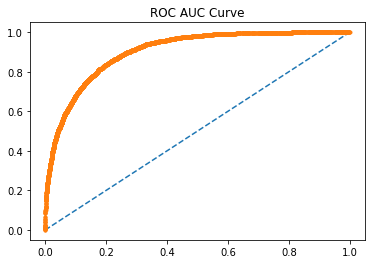

---------------------------------------- Support Vector Classifier ----------------------------------------
Accuracy score for  Support Vector Classifier  is  0.8540576398614285


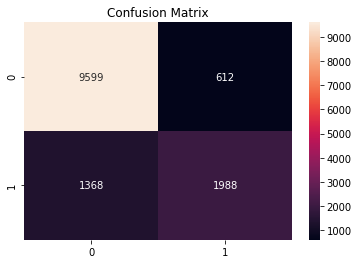

              precision    recall  f1-score   support

         0.0       0.88      0.94      0.91     10211
         1.0       0.76      0.59      0.67      3356

    accuracy                           0.85     13567
   macro avg       0.82      0.77      0.79     13567
weighted avg       0.85      0.85      0.85     13567

0.8916500983012897


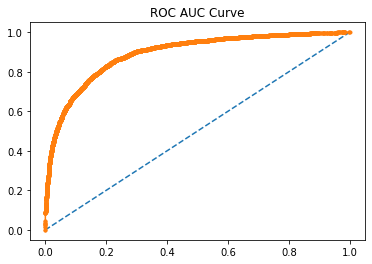

---------------------------------------- Decision Tree Classifier ----------------------------------------
Accuracy score for  Decision Tree Classifier  is  0.8138866366919731


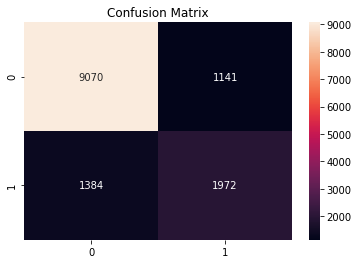

              precision    recall  f1-score   support

         0.0       0.87      0.89      0.88     10211
         1.0       0.63      0.59      0.61      3356

    accuracy                           0.81     13567
   macro avg       0.75      0.74      0.74     13567
weighted avg       0.81      0.81      0.81     13567

0.7673298993151535


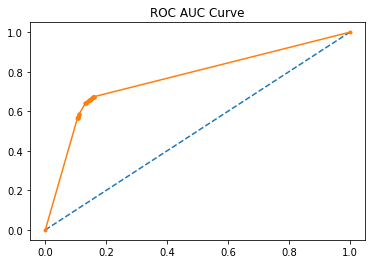

---------------------------------------- Random Forest Classifier ----------------------------------------
Accuracy score for  Random Forest Classifier  is  0.8385789046952163


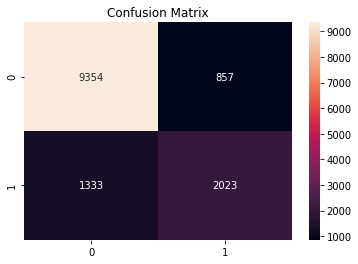

              precision    recall  f1-score   support

         0.0       0.88      0.92      0.90     10211
         1.0       0.70      0.60      0.65      3356

    accuracy                           0.84     13567
   macro avg       0.79      0.76      0.77     13567
weighted avg       0.83      0.84      0.83     13567

0.8865159088407428


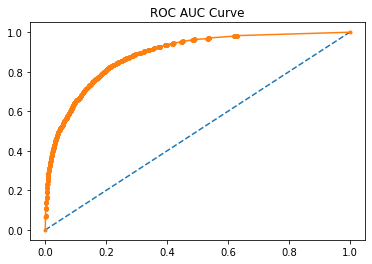

In [89]:
auc_scores = []
accuracy_scores = []
for (algo, name) in algos.items():
  print("-"*40, name, "-"*40)
  y_test_pred = train(algo, x_train, y_train, x_test, y_test)
  roc_auc_score, accuracy_score = evaluate(algo, name, x_test, y_test, y_test_pred)
  auc_scores.append(roc_auc_score)
  accuracy_scores.append(accuracy_score)

In [91]:
model_comparison = pd.DataFrame(list(zip(accuracy_scores, auc_scores)), columns = ['Accuracy Score', 'ROC AUC Score'], index = models)

model_comparison

,Accuracy Score,ROC AUC Score
Logistic Regression,0.847498,0.903287
Support Vector Classifier,0.854058,0.891650
Decision Tree Classifier,0.813887,0.767330
Random Forest Classifier,0.838579,0.886516
